In [1]:
import tifffile

In [2]:
from matplotlib import pyplot as plt
%matplotlib inline

In [3]:
from copy import deepcopy
import numpy as np
from skimage.filters import rank
from scipy.signal import convolve2d

footprint = np.array([[0, 1, 0], 
                      [1, 0, 1], 
                      [0, 1 ,0]])

mask = footprint / footprint.sum()

def get_two_views(one_slice):
    first_sample = deepcopy(one_slice)
    second_sample = deepcopy(one_slice)
    
    x,y = np.meshgrid(*[np.arange(i) for i in first_sample.shape])
    first_sample[(x + y)%2 == 0] = 0
    second_sample[(x + y)%2 == 1] = 0
    
    
    filtered_first = convolve2d(first_sample, mask, mode='same')
    first_sample[(x + y)%2 == 0] = filtered_first[(x + y)%2 == 0]

    filtered_second = convolve2d(second_sample, mask, mode='same')
    second_sample[(x + y)%2 == 1] = filtered_second[(x + y)%2 == 1]
    
    return first_sample, second_sample

In [4]:
from skimage.morphology import disk
from skimage.exposure import rescale_intensity

In [5]:
def get_random_voxels(img, count):
    return img[tuple([np.random.randint(0, img.shape[i], count) for i in range(img.ndim)])]

CHUNK_SIZE = 256
import dask.array as da
from skimage.exposure import rescale_intensity
from functools import partial

def scale_intensity_parallel(img, in_percentiles=(0.1, 99.9), out_range=(-1, 1)):
    rs = get_random_voxels(img, 1_000_000)
    f = np.percentile(rs, in_percentiles[0])
    t = np.percentile(rs, in_percentiles[1])
    
    img = da.from_array(img, chunks=CHUNK_SIZE)
    scaler = partial(rescale_intensity, in_range=(f,t), out_range=out_range)
    img = img.map_blocks(scaler, dtype=img.dtype)
    img = np.array(img, dtype=img.dtype)

    return img

In [6]:
def get_scaled_volume(v):
    v_f = v.astype(np.float32)
    return scale_intensity_parallel(v_f)

## Visual verview

In [7]:
messy = tifffile.imread('/mnt/HD-LSDF/Xenopus/2021_11_Xenopus/Vergleichsmessungen_NN/Xenopus_16_3p125_ms_exp_750_proj/slices.tif')

In [79]:
messy_slc = tifffile.imread('/mnt/HD-LSDF/Xenopus/2021_11_Xenopus/Vergleichsmessungen_NN/Xenopus_16_3p125_ms_exp_750_proj/slices.tif')

In [43]:
messy.shape

(2016, 2016, 2016)

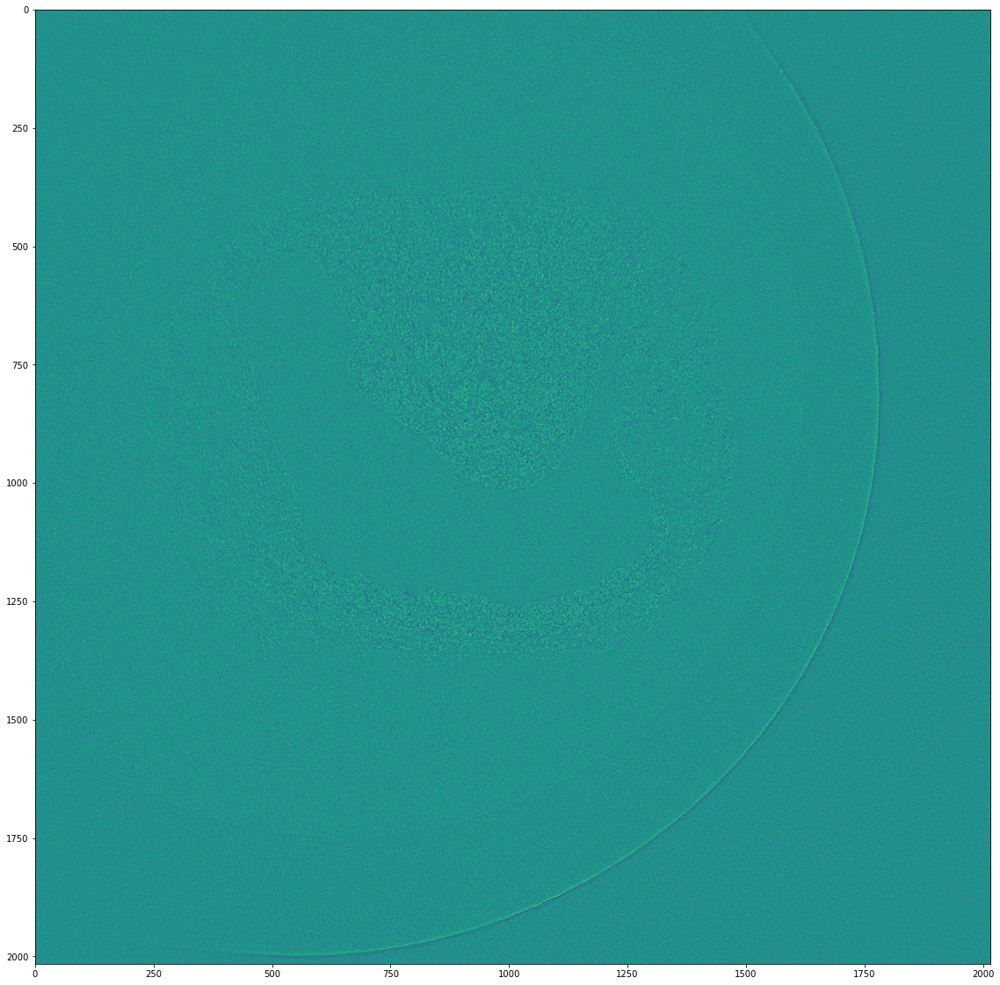

In [80]:
plt.figure(figsize=(20, 20))
plt.imshow(messy_slc)
plt.show()

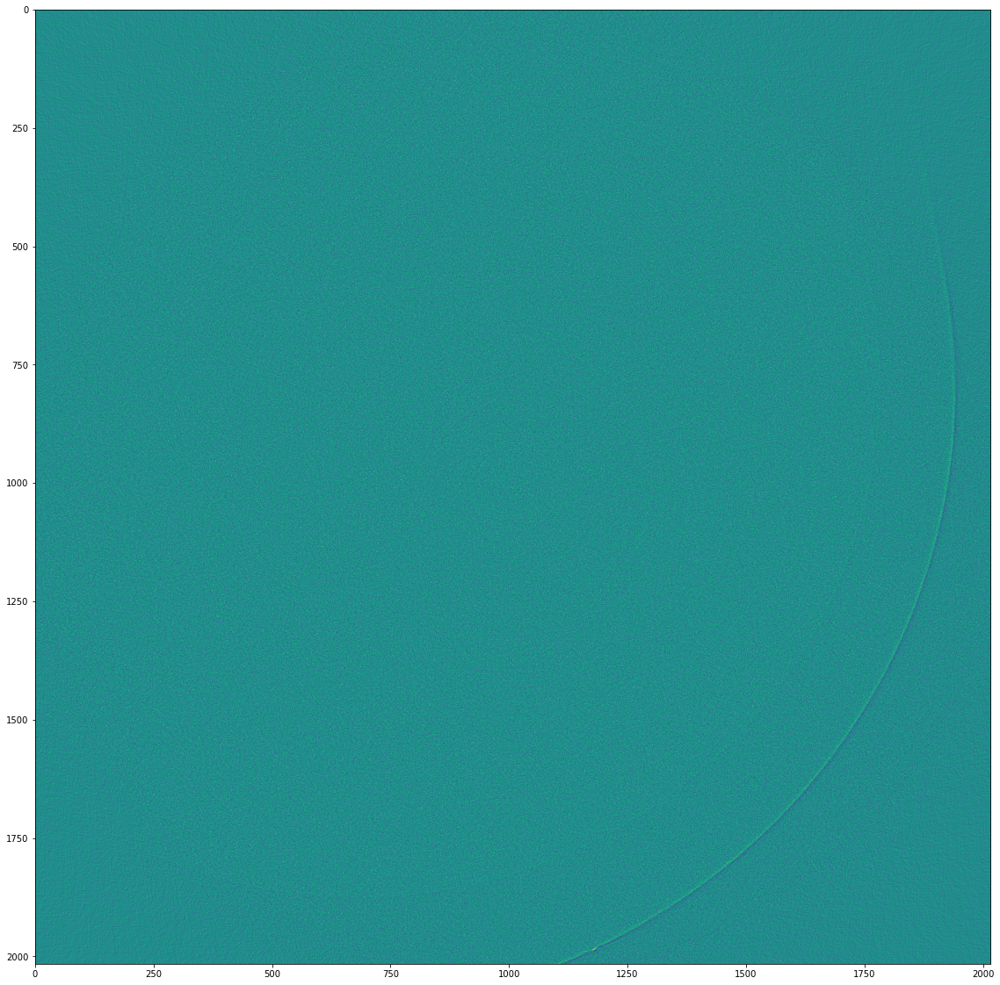

In [84]:
plt.figure(figsize=(20, 20))
plt.imshow(messy[300])
plt.show()

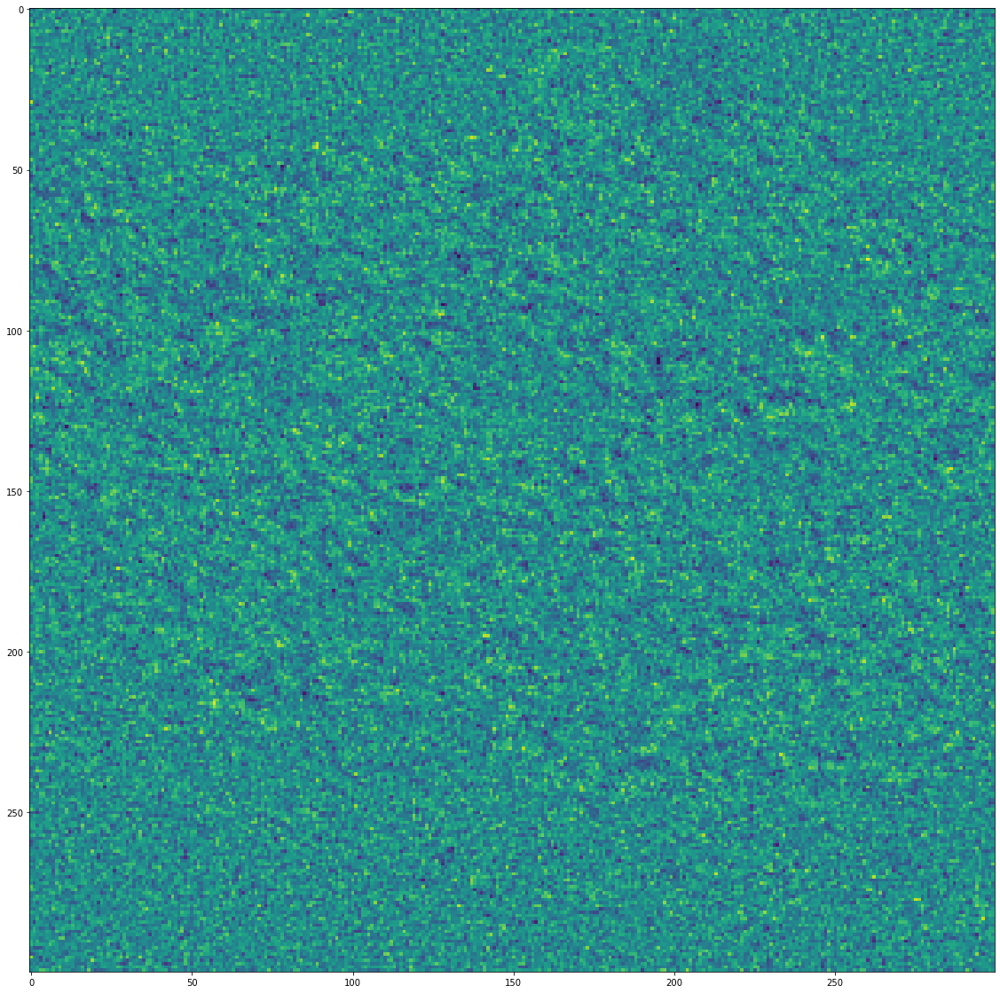

In [25]:
plt.figure(figsize=(20, 20))
plt.imshow(messy[1500:1800, 500:800])
plt.show()

In [8]:
f,s = get_two_views(messy[1000])

In [17]:
(f/s)[1200:1400, 600:800]

array([[ 1.7705275e-02,  2.0004699e+00,  1.0044684e-01, ...,
        -1.9323449e+00, -4.6951541e-01, -2.9576261e+00],
       [-3.4592924e-01, -3.5872802e-01, -5.7426536e-01, ...,
        -3.3519492e-02,  5.2610771e+01,  1.5972375e+00],
       [ 1.0968567e-01,  9.2258996e-01,  6.1566453e+00, ...,
        -1.4594871e+00,  2.4232607e-01,  1.8787576e+00],
       ...,
       [ 8.5967302e-01,  1.4972246e-01,  4.3854275e+00, ...,
        -2.4736099e-01, -7.0494738e+00,  5.8420706e-01],
       [ 6.6682210e+00,  7.1376381e+00,  1.7976551e-01, ...,
         3.4305065e+00,  8.3452731e-01,  2.1984918e+00],
       [ 1.5667067e+01,  2.6157779e-01,  1.3503939e-02, ...,
         2.1466481e-02, -1.5933261e+00,  8.0340952e-01]], dtype=float32)

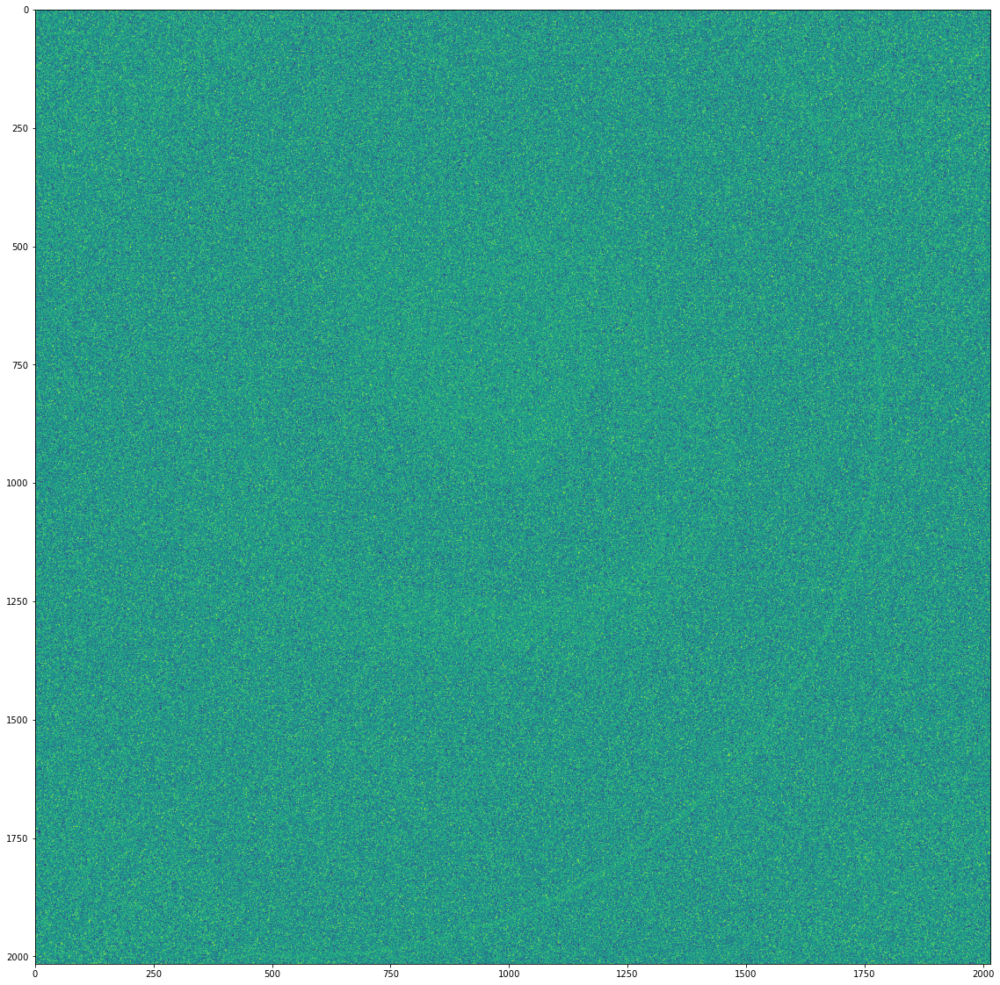

In [26]:
plt.figure(figsize=(20, 20))
plt.imshow(np.clip(f/s, -5, 5))
plt.show()

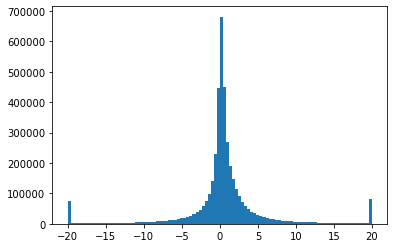

In [23]:
plt.hist(np.clip((f/s).flatten(), -20, 20), bins=100);

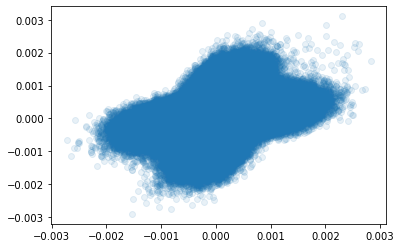

In [14]:
plt.scatter(f, s, alpha=0.1);

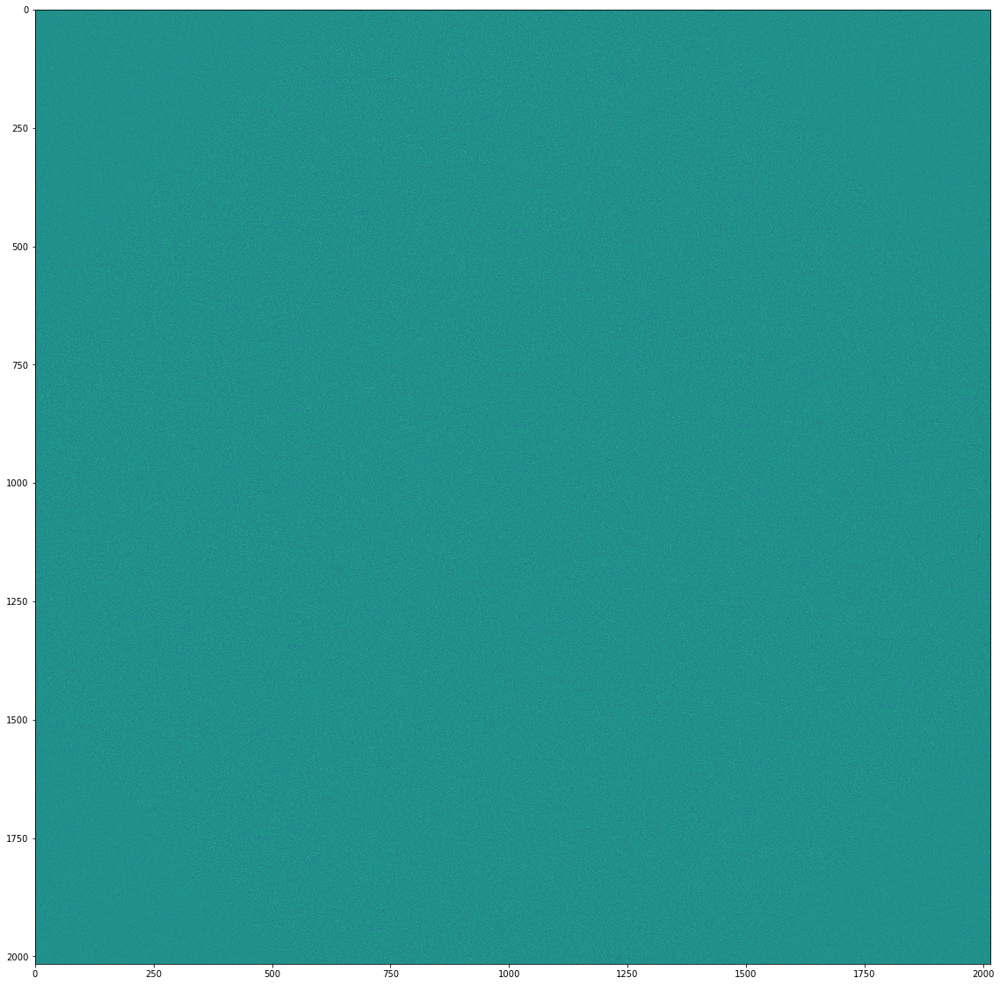

In [90]:
plt.figure(figsize=(20, 20))
plt.imshow((f-s))
plt.show()

/tmp/ipykernel_2569542/179709856.py:2: UserWarning: Possible precision loss converting image of type float32 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  plt.imshow(rank.entropy(rescale_intensity(f-s, out_range=(-1, 1)), footprint=disk(5)))


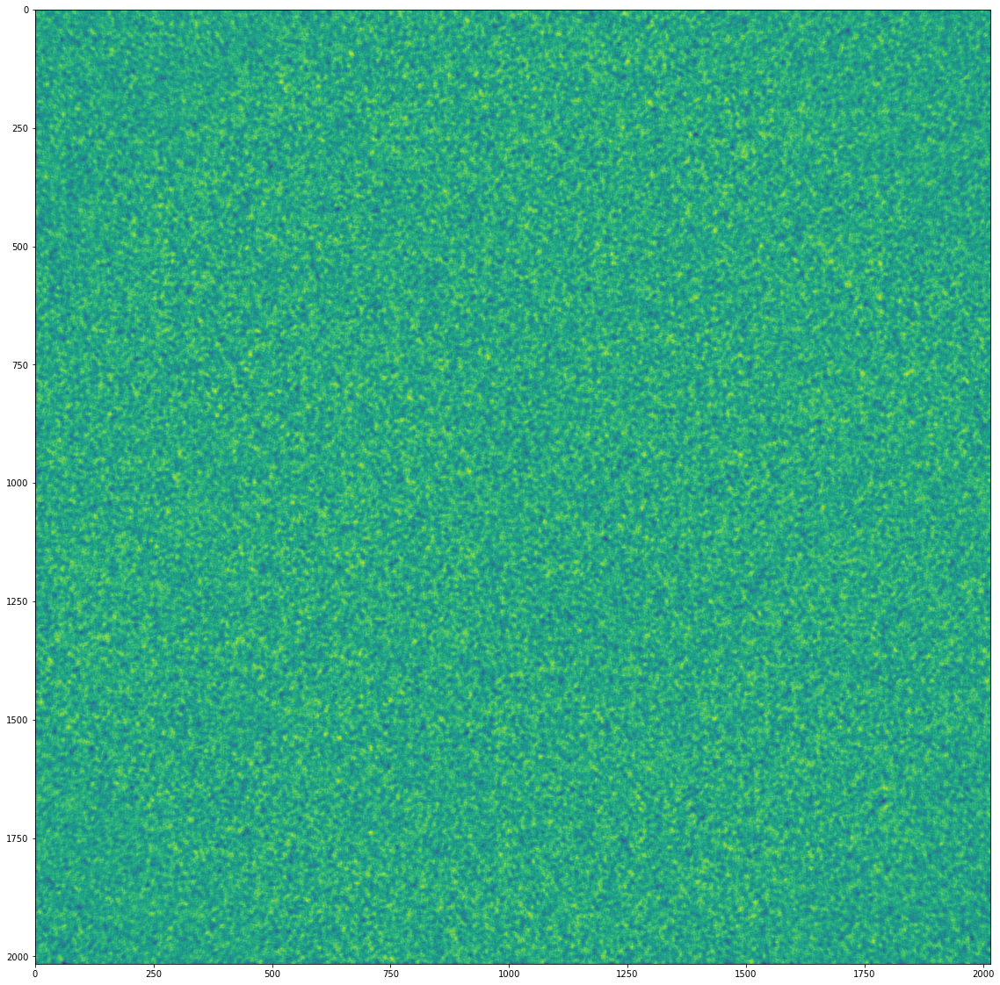

In [92]:
plt.figure(figsize=(20, 20))
plt.imshow(rank.entropy(rescale_intensity(f-s, out_range=(-1, 1)), footprint=disk(5)))
plt.show()

## Processing

In [7]:
crop_from = {13:665, 14:430, 15:200, 16:300}

In [8]:
valid_volumes = [15]

In [9]:
from glob import glob
from tqdm.auto import tqdm
import os

In [10]:
from joblib import Parallel, delayed

In [13]:
bad_adr = '/mnt/HD-LSDF/Xenopus/2021_11_Xenopus/Vergleichsmessungen_NN/Xenopus_{i}_3p125_ms_exp_750_proj/slices.tif'

In [17]:
os.makedirs('/mnt/data/denoising/xeno/reco/train/volumes', exist_ok=True)
os.makedirs('/mnt/data/denoising/xeno/reco/train/labels', exist_ok=True)
os.makedirs('/mnt/data/denoising/xeno/reco/valid/volumes', exist_ok=True)
os.makedirs('/mnt/data/denoising/xeno/reco/valid/labels', exist_ok=True)
os.makedirs('/mnt/data/denoising/xeno/reco/all_volumes', exist_ok=True)
os.makedirs('/mnt/data/denoising/xeno/reco/all_volumes_processed', exist_ok=True)

In [22]:
for messy_xenopus_id in tqdm([13,14,15,16]):
    vol = tifffile.imread(bad_adr.format(i=messy_xenopus_id))
    vol = vol[crop_from[messy_xenopus_id]:]
    
    vol = get_scaled_volume(vol)
    
    pairs = Parallel(n_jobs=64)(delayed(get_two_views)(slc) for slc in vol)
    vol_a, vol_b = [np.stack(i) for i in zip(*pairs)]
    
    part = 'valid' if (messy_xenopus_id in valid_volumes) else 'train'
    
    tifffile.imsave(f'/mnt/data/denoising/xeno/reco/{part}/volumes/{messy_xenopus_id}_a.tif', vol_a)
    tifffile.imsave(f'/mnt/data/denoising/xeno/reco/{part}/volumes/{messy_xenopus_id}_b.tif', vol_b)
    # And now a<->b in filnames, so they target and volume aren't the same
    tifffile.imsave(f'/mnt/data/denoising/xeno/reco/{part}/labels/{messy_xenopus_id}_b.tif', vol_a) 
    tifffile.imsave(f'/mnt/data/denoising/xeno/reco/{part}/labels/{messy_xenopus_id}_a.tif', vol_b)
    # And now saving the whole file
    tifffile.imsave(f'/mnt/data/denoising/xeno/reco/all_volumes/{messy_xenopus_id}.tif', vol)

  0%|          | 0/3 [00:00<?, ?it/s]

OSError: [Errno 28] No space left on device

In [11]:
for messy_xenopus_id in tqdm([13,14,15,16]):
    part = 'valid' if (messy_xenopus_id in valid_volumes) else 'train'
    
    vol_a = tifffile.imread(f'/mnt/data/denoising/xeno/reco/{part}/volumes/{messy_xenopus_id}_a.tif')
    vol_b = tifffile.imread(f'/mnt/data/denoising/xeno/reco/{part}/volumes/{messy_xenopus_id}_b.tif')
    
    print(np.abs(vol_a - vol_b).mean())

  0%|          | 0/4 [00:00<?, ?it/s]

0.23329392
0.23463777
0.23411109
0.23334713
